In [354]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
import os, math
import matplotlib.image as mpimg
import glob, torch
import matplotlib as mpl
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from skimage import io
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torch.utils.data.sampler import SubsetRandomSampler, RandomSampler
from torch.utils.data import TensorDataset
import torch.optim as optim
import copy
from sklearn.decomposition import PCA
import seaborn as sns

In [2]:
import numpy as np
import torch
import torchvision.models as models
import torch.nn.functional as F
from glob import glob
import cv2
from src.utility import preprocess_image, convert_image_np, getImageNetDict, getImageNetCodeDict
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn as nn
import copy
from torchvision import transforms, utils
import tqdm
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.autograd import Variable

In [3]:
def to_var(x, *args, **kwargs):
    if type(x) is list or type(x) is tuple:
        x = [Variable(x_, *args, **kwargs) for x_ in x]
    else:
        x = Variable(x, *args, **kwargs)
    return x

# Imagenet dataset


Model: Alexnet

W dimension: 4096

Concept: 200 image classes

Output: 200 image classes

In [386]:
alexnet = models.alexnet(pretrained=True).cuda()

In [387]:
imagenetdict = getImageNetDict()
imagenetcodedict = getImageNetCodeDict()
alexnet

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), dilation=(1, 1), ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), dilation=(1, 1), ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), dilation=(1, 1), ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace)
    (3): Dropout(p=0.5)
    (4): Linear(in_features=4096,

In [388]:
model = copy.deepcopy(alexnet).cuda()
model.classifier = nn.Sequential(*list(alexnet.classifier.children())[:-1])
W = list(alexnet.classifier.children())[-1].weight.cpu().data.numpy()
net = alexnet

In [7]:
# display the basis vectors
def preprocess_im(im, volatile=False):
    original_image = cv2.imread(im)
    prep_img = preprocess_image(original_image)
    if volatile:
        prep_img.volatile = True
    return prep_img.cuda()

def show_image(images, title=''):
    seq = []
    for im in images:
        prep_img = preprocess_im(im, volatile=True)
        seq.append(prep_img)
    images_batch = torch.cat(seq, dim=0)
    grid = utils.make_grid(images_batch.data)   
    plt.imshow(convert_image_np(grid))
    plt.title(title)
    plt.show()

# old cell should not run: use the 9 concepts cell instead

(4096,)


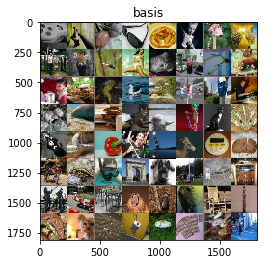

In [8]:
# visualize random images in each class of input
types = glob('/data/jiaxuan/CNN_missingness/images/tiny-imagenet-200/train/*')
res = []
concepts = []
for t in types:
    all_pics = glob(t + '/images/*')
    # for each 200 category, choose 21
    rs = np.random.choice(range(len(all_pics)), 21, replace=False)
    res.extend([all_pics[r] for r in rs])
    
    c = imagenetcodedict[t.split('/')[-1]]
    concepts.extend([c for r in rs])
    
order = np.random.permutation(W.shape[1])
res = np.array(res)[order]#np.random.permutation(res)[:4096]
concepts = np.array(concepts)[order]
print(res.shape)

fig = plt.figure()
fig.set_figwidth(30)

# the image resolution is 64 x 64
show_image(res[:64], 'basis')
basis = res

In [152]:
labels = concepts
concepts = set(concepts)

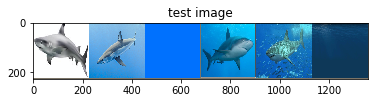

In [153]:
tests = glob('/data/jiaxuan/CNN_missingness/images/tests/sharks/*')[:64] # sharks
show_image(tests, 'test image')

In [154]:
def predict(net, im):
    net.eval()
    prep_img = preprocess_im(im)
    prediction = net(prep_img).data.cpu().numpy().argmax()
    return imagenetdict[prediction], prediction

test_ind = 0
word, predict_id = predict(net, tests[test_ind])
word, predict_id

('hammerhead, hammerhead shark', 4)

In [155]:
def extract_features(net, images):
    net.eval()
    seq = []
    for im in tqdm.tqdm(images):
        prep_img = preprocess_im(im, volatile=True)
        seq.append(prep_img)
        
    features = []
    for i in tqdm.tqdm(range(0, len(seq), 100)):
        images_batch = torch.cat(seq[i:i+100], dim=0)
        features.append(net(images_batch))
    return torch.cat(features, dim=0)
    
features = extract_features(model, basis)
P = features.transpose(0,1).data.cpu().numpy()

tests_features = extract_features(model, tests).data.cpu().numpy()

100%|██████████| 1/1 [00:00<00:00, 391.95it/s]


In [204]:
# temporary activations
activations = P.T
#activations = np.vstack([activations, activations])
A = activations # A should be n x r
print(A.shape)

(4096, 4096)


In [179]:
newW = W.dot(P)
print(newW.shape)

# the new weight matrix is just W A
def visContribution(W, predict_id=940, top=10, test_image_name=None, coordinate=True, use_abs=True):
    
    if test_image_name is not None:
        word, predict_id = predict(net, test_image_name)
        print(word, predict_id)
    else:
        word = imagenetdict[predict_id]

    # an example explaination: W 1000 x num_basis
    weights = W[predict_id]

    if test_image_name is not None:
        b = extract_features(model, [test_image_name])[0].data.cpu().numpy()
        x = lst_solve(A, b)
        if coordinate:
            if not use_abs:
                criteria = x
            else:
                criteria = np.abs(x)
        else:
            if not use_abs:
                criteria = x
            else:
                criteria = np.abs(weights * x)
        args = np.argsort(criteria)[::-1]
    else:
        if not use_abs:
            args = np.argsort(weights)[::-1]
        else:
            args = np.argsort(np.abs(weights))[::-1]

    # visualize
    selection = args[:top]
    print('%s =' % word)

    theta = weights[selection]
    images = np.array(basis)[selection]
    
    if test_image_name is not None:
        input_weights = x[selection]
        original_image = cv2.imread(test_image_name)
        correct_color_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        plt.imshow(correct_color_image)
        plt.axis('off')
        plt.title('this image =')
        plt.show()
    
    ncols = min(top, len(images))
    fig, ax = plt.subplots(ncols=ncols)
    fig.set_figheight(10)
    fig.set_figwidth(20)

    plt.legend()
    for i, col in enumerate(ax):
        original_image = cv2.imread(images[i])
        correct_color_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        col.imshow(correct_color_image)
        col.get_xaxis().set_ticks([])
        col.get_yaxis().set_ticks([])
        #word, predict_id = predict(net, images[i])
        word = imagenetcodedict[images[i].split('/')[-1].split('_')[0]]
        col.set_title(theta[i])
        col.set_xlabel(word[:18]) # set character max to avoid occluding the visualization
     
        if test_image_name is not None:
            if coordinate:
                col.set_title(input_weights[i])                
            else:
                col.set_title(theta[i] * input_weights[i])
            col.set_ylabel('%.2f * %.2f' % (theta[i], input_weights[i]))
    plt.show()

def visW(W, A, predict_id=940, top=10, test_image_name=None, coordinate=True, use_abs=True):
    
    if test_image_name is not None:
        word, predict_id = predict(net, test_image_name)
        print(word, predict_id)
    else:
        word = imagenetdict[predict_id]

    # an example explaination: W 1000 x num_basis
    weights = W[predict_id]

    if test_image_name is not None:
        b = extract_features(model, [test_image_name])[0].data.cpu().numpy()
        x = lst_solve(A, b)
        if coordinate:
            if not use_abs:
                criteria = x
            else:
                criteria = np.abs(x)
        else:
            if not use_abs:
                criteria = weights * x
            else:
                criteria = np.abs(weights * x)
        args = np.argsort(criteria)[::-1]
    else:
        if not use_abs:
            args = np.argsort(weights)[::-1]
        else:
            args = np.argsort(np.abs(weights))[::-1]

    # visualize
    selection = args[:top]
    print('%s =' % word)

    theta = weights[selection]
    
    # images: of max activation along each direction
    W_order = np.argmax(A, axis=0)[:len(basis)]
    W_basis = np.array(basis)[W_order]
    images = np.array(W_basis)[selection]
    
    if test_image_name is not None:
        input_weights = x[selection]
        original_image = cv2.imread(test_image_name)
        correct_color_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        plt.imshow(correct_color_image)
        plt.axis('off')
        plt.title('this image =')
        plt.show()
    
    ncols = min(top, len(images))
    fig, ax = plt.subplots(ncols=ncols)
    fig.set_figheight(10)
    fig.set_figwidth(20)

    plt.legend()
    for i, col in enumerate(ax):
        original_image = cv2.imread(images[i])
        correct_color_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        col.imshow(correct_color_image)
        col.get_xaxis().set_ticks([])
        col.get_yaxis().set_ticks([])
        #word, predict_id = predict(net, images[i])
        word = imagenetcodedict[images[i].split('/')[-1].split('_')[0]]
        col.set_title(theta[i])
        col.set_xlabel(word[:18]) # set character max to avoid occluding the visualization
     
        if test_image_name is not None:
            if coordinate:
                col.set_title(input_weights[i])                
            else:
                col.set_title(theta[i] * input_weights[i])
            col.set_ylabel('%.2f * %.2f' % (theta[i], input_weights[i]))
    plt.show()

(1000, 4096)


single image explaination, not orthogonal
WP basis
combination lock =


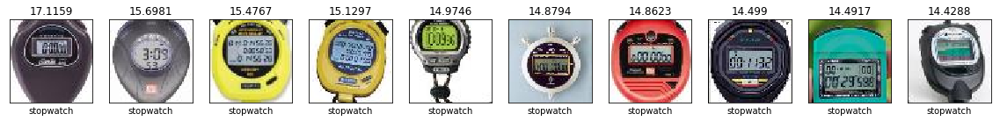

WP max activation
combination lock =


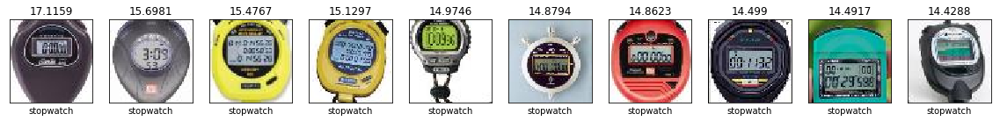

W max activation
combination lock =


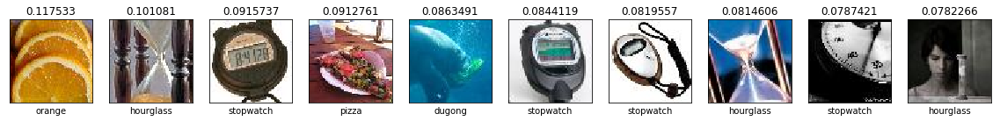

In [182]:
print('single image explaination, not orthogonal')
categories = [507]#[507]#[950]#[107, 249, 940, 1, 2, 113]
for cat in categories:
    print('WP basis')
    visContribution(newW, cat)
    print('WP max activation')
    visW(newW, A.dot(P), cat)
    print('W max activation')
    visW(W, A, cat)


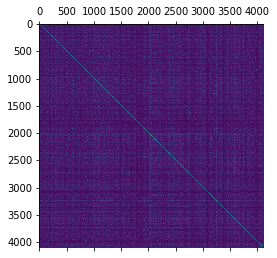

In [183]:
plt.matshow(P.T.dot(P))
plt.show()

# orthogonalization

In [160]:
def check_ortho(theta_list, plot=False, verbose=False):
    Q = [t/np.linalg.norm(t) for t in theta_list]
    Q = np.vstack(Q).T
    error = np.sum(np.abs(Q.T.dot(Q) - np.eye(Q.shape[1])))
    if verbose:
        print("orthogonal check error: ", error)
    if plot:
        print(Q.T.dot(Q))
        plt.matshow(Q.T.dot(Q))
        plt.show()
    return error
    
def orthogonize_(theta, prev_theta_list):
    '''goal: theta should be orthogonal to all vectors in prev_theta_list'''
    theta = theta / np.linalg.norm(theta)
    for t in prev_theta_list:
        theta = theta - theta.dot(t) / np.dot(t,t) * t 
    return theta

def orthogonize(theta, prev_theta_list, verbose=False):
    done = len(prev_theta_list) == 0
    while not done:
        theta = orthogonize_(theta, prev_theta_list)
        #check_ortho(prev_theta_list, plot=False)        
        #check_ortho(prev_theta_list + [theta], plot=False)
        #print('in middle', theta)
        #print(check_ortho(prev_theta_list + [theta]))
        #if  check_ortho(prev_theta_list + [theta]) > 1e-3:
            #print(check_ortho(prev_theta_list + [theta]))
        if np.linalg.norm(theta) < 1e-10: # give a random direction to theta to theta too close to 0
            if verbose:
                print('restart a vector')
            theta = np.random.randn(len(theta))
        else:
            done = True
        
    return theta / np.linalg.norm(theta) # to keep theta in a good range for numerical stability

theta_list = []
for i in tqdm.tqdm(range(P.shape[1])):
    t = orthogonize(P[:,i], theta_list)
    theta_list.append(t)
newP = np.vstack(theta_list).T

100%|██████████| 4096/4096 [01:22<00:00, 49.38it/s] 


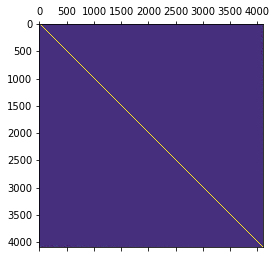

0.000141986947837
0.000953773015987


In [161]:
plt.matshow(newP.T.dot(newP))
plt.show()

print(np.abs(newP.T.dot(newP) - np.eye(W.shape[1])).mean())
print(np.abs(newP.dot(newP.T) - np.eye(W.shape[1])).mean())

single image explaination, orthogonal
WP basis
jellyfish =


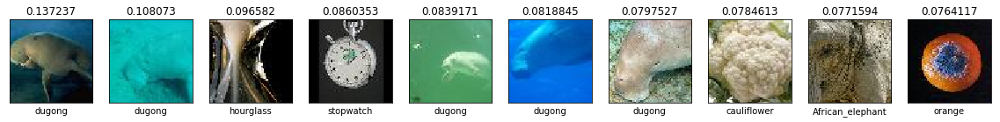

WP max activation
jellyfish =


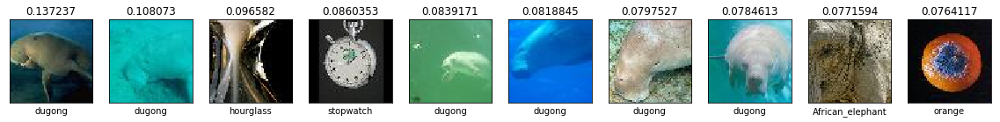

W max activation
jellyfish =


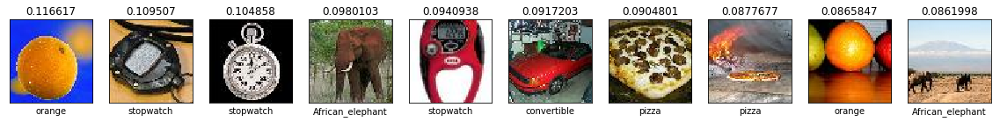

WP basis
malamute, malemute, Alaskan malamute =


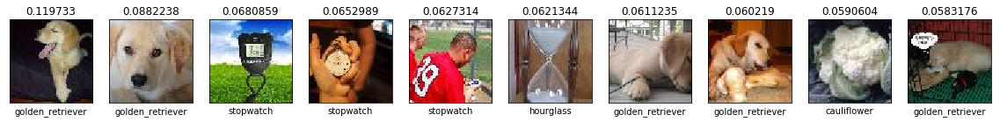

WP max activation
malamute, malemute, Alaskan malamute =


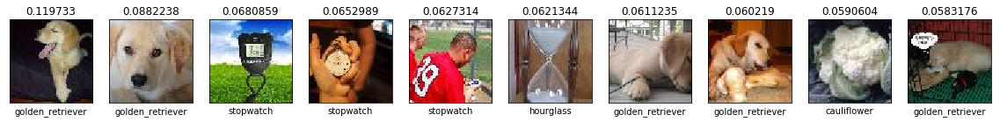

W max activation
malamute, malemute, Alaskan malamute =


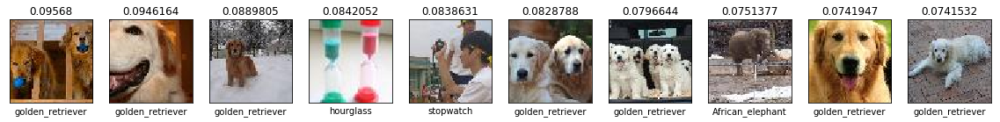

WP basis
spaghetti squash =


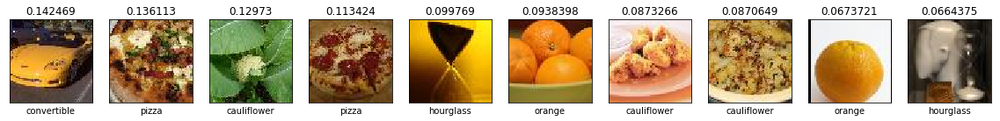

WP max activation
spaghetti squash =


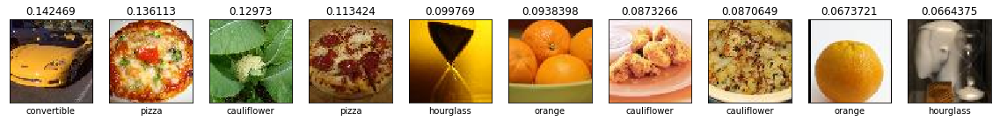

W max activation
spaghetti squash =


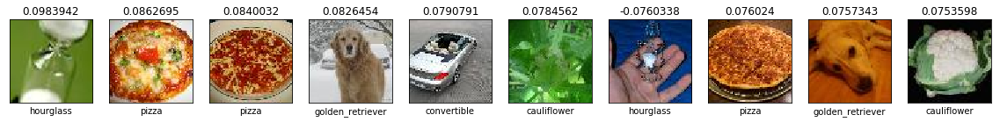

WP basis
goldfish, Carassius auratus =


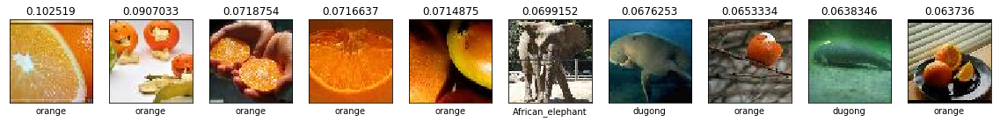

WP max activation
goldfish, Carassius auratus =


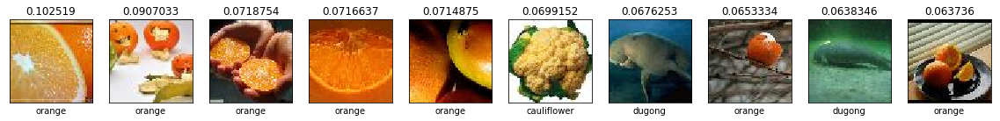

W max activation
goldfish, Carassius auratus =


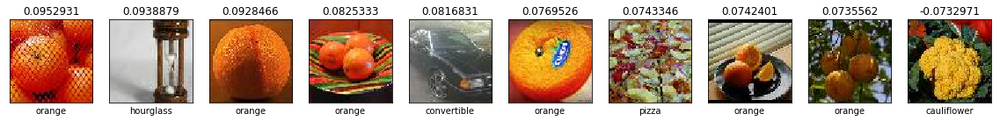

WP basis
great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias =


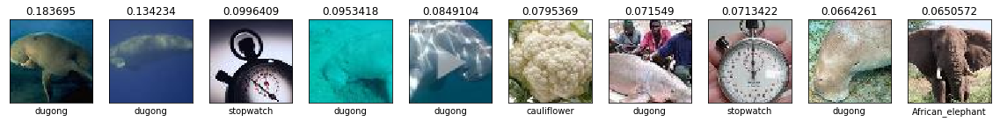

WP max activation
great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias =


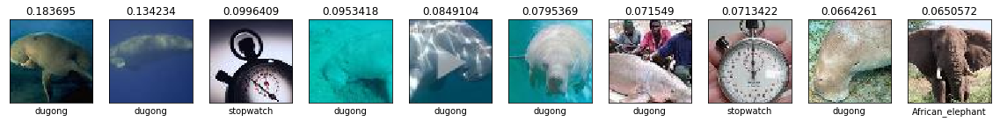

W max activation
great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias =


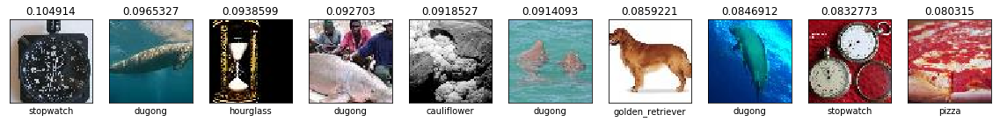

WP basis
snail =


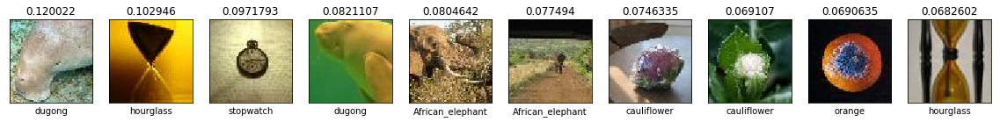

WP max activation
snail =


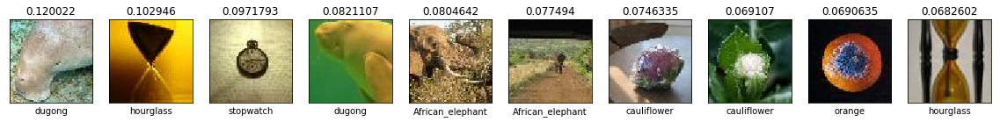

W max activation
snail =


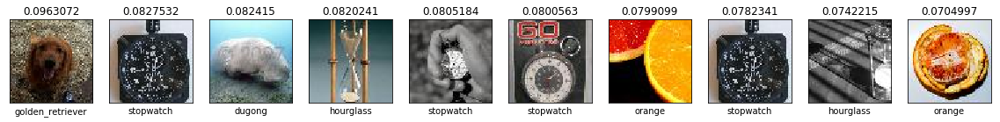

In [185]:
print('single image explaination, orthogonal')
categories = [107, 249, 940, 1, 2, 113]
for cat in categories:
    print('WP basis')
    visContribution(W.dot(newP), cat, use_abs=False)
    print('WP max activation')
    visW(W.dot(newP), A.dot(newP), cat, use_abs=False)
    print('W max activation')
    visW(W, A, cat)

# normalize by activation

In [164]:
def data_range(A, t):
    return A.dot(t/t.dot(t)).ravel().std()

def normalize_theta(A, t):
    drange = data_range(A, t)
    if drange == 0: # no need to normalize
        return t
    return t * drange # multiply so that in P^-1 is divide by

theta_list = []
for i in tqdm.tqdm(range(newP.shape[1])):
    t = newP[:,i]
    theta_list.append(normalize_theta(A, t))
new_norm_P = np.vstack(theta_list).T

100%|██████████| 4096/4096 [00:18<00:00, 217.44it/s]


In [192]:
theta_list = []
W_P = np.eye(W.shape[1])
for i in tqdm.tqdm(range(W_P.shape[1])):
    t = W_P[:,i]
    theta_list.append(normalize_theta(A, t))
W_P = np.vstack(theta_list).T

100%|██████████| 4096/4096 [09:49<00:00,  6.95it/s]


single image explaination, orthogonal
WP max activation
jellyfish =


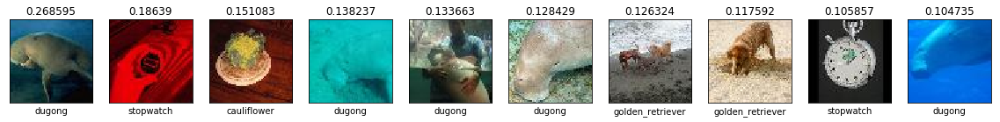

W max activation
jellyfish =


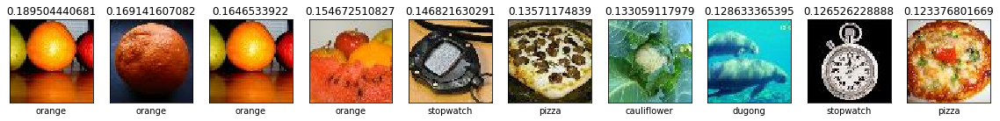

WP max activation
malamute, malemute, Alaskan malamute =


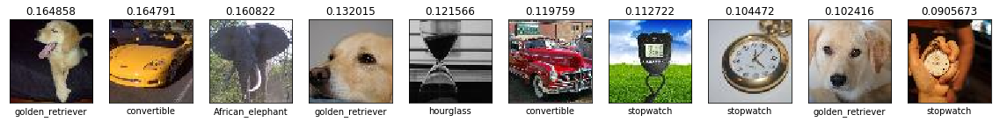

W max activation
malamute, malemute, Alaskan malamute =


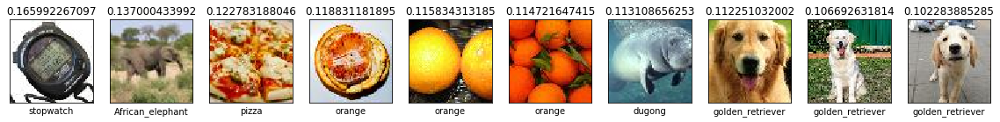

WP max activation
spaghetti squash =


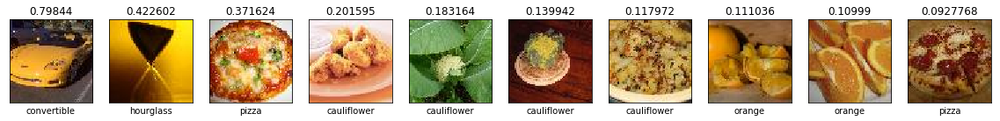

W max activation
spaghetti squash =


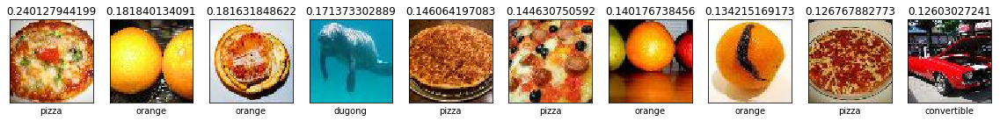

WP max activation
goldfish, Carassius auratus =


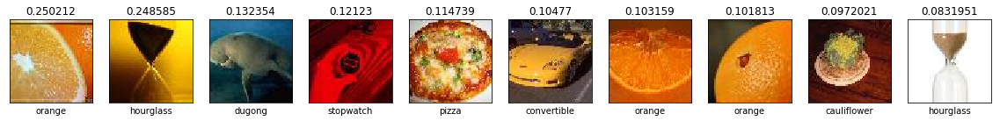

W max activation
goldfish, Carassius auratus =


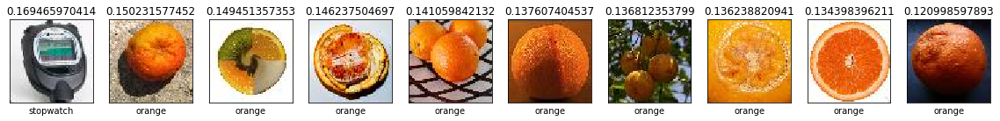

WP max activation
great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias =


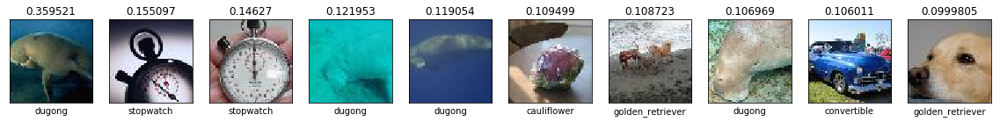

W max activation
great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias =


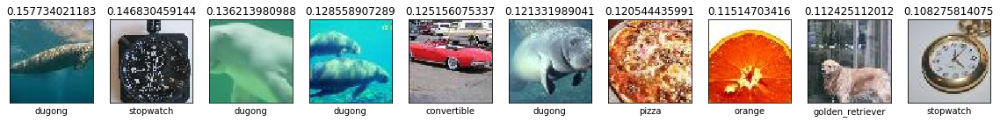

WP max activation
snail =


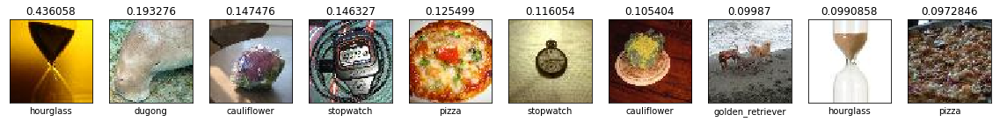

W max activation
snail =


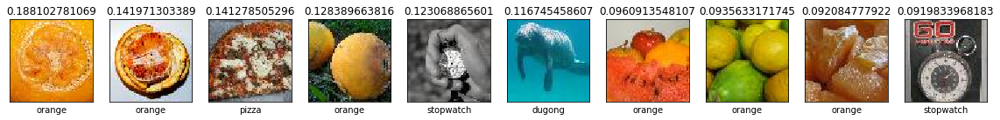

In [205]:
print('single image explaination, orthogonal')
categories = [107, 249, 940, 1, 2, 113]
for cat in categories:
    #print('WP basis')
    #visContribution(W.dot(new_norm_P), cat, use_abs=False)
    print('WP max activation')
    visW(W.dot(new_norm_P), A.dot(new_norm_P), cat, use_abs=False)
    print('W max activation')
    visW(W.dot(W_P), A, cat, use_abs=False)

# choose 9 classes

In [113]:
name2code = dict((v, k) for k, v in imagenetcodedict.items())

In [99]:
[imagenetcodedict[t.split('/')[-1]] for t in types]

['guinea_pig',
 'convertible',
 'stopwatch',
 'tractor',
 'black_stork',
 'pole',
 'bullet_train',
 'beer_bottle',
 'lawn_mower',
 'ice_cream',
 'poncho',
 'school_bus',
 'mantis',
 'gondola',
 'steel_arch_bridge',
 'orange',
 'gazelle',
 'Christmas_stocking',
 'pizza',
 'desk',
 'birdhouse',
 'seashore',
 'volleyball',
 'chest',
 'parking_meter',
 'German_shepherd',
 'sulphur_butterfly',
 'lesser_panda',
 'vestment',
 'black_widow',
 'Arabian_camel',
 'beaker',
 'maypole',
 'orangutan',
 'plunger',
 'jinrikisha',
 'acorn',
 'golden_retriever',
 'baboon',
 'bikini',
 'walking_stick',
 'Chihuahua',
 'king_penguin',
 'hourglass',
 'espresso',
 'trolleybus',
 'drumstick',
 'umbrella',
 'pop_bottle',
 'water_tower',
 'swimming_trunks',
 'academic_gown',
 'apron',
 'beach_wagon',
 'grasshopper',
 'jellyfish',
 'dining_table',
 'cougar',
 'torch',
 'sewing_machine',
 'picket_fence',
 'neck_brace',
 'magnetic_compass',
 'American_lobster',
 'snorkel',
 'kimono',
 'flagpole',
 'lakeside',
 'ba

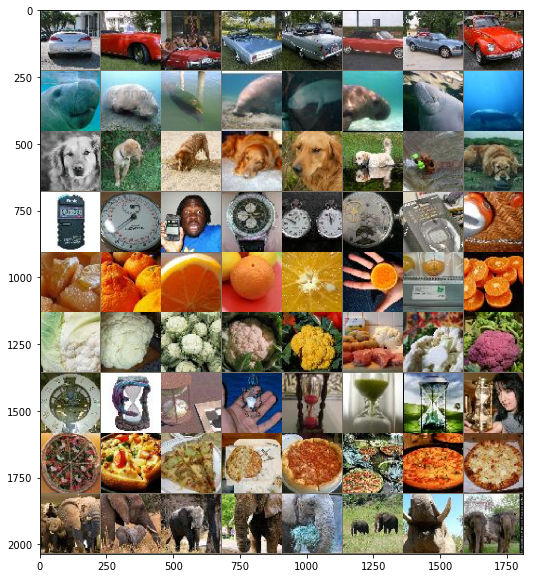

In [150]:
def show_concepts(concepts):
    
    prefix = '/data/jiaxuan/CNN_missingness/images/tiny-imagenet-200/train/'
    res = []
    for c in concepts:
        name = prefix + name2code[c]
        all_pics = glob(name + '/images/*')
        rs = np.random.choice(range(len(all_pics)), 8, replace=False)
        res.extend([all_pics[r] for r in rs])
    
    plt.figure(figsize=(10,10))
    show_image(res)
    plt.show()
    
concept_classes = ['convertible', 'dugong', 'golden_retriever', 'stopwatch', 'orange', 'cauliflower', 'hourglass', 'pizza', 'African_elephant']
show_concepts(concept_classes)

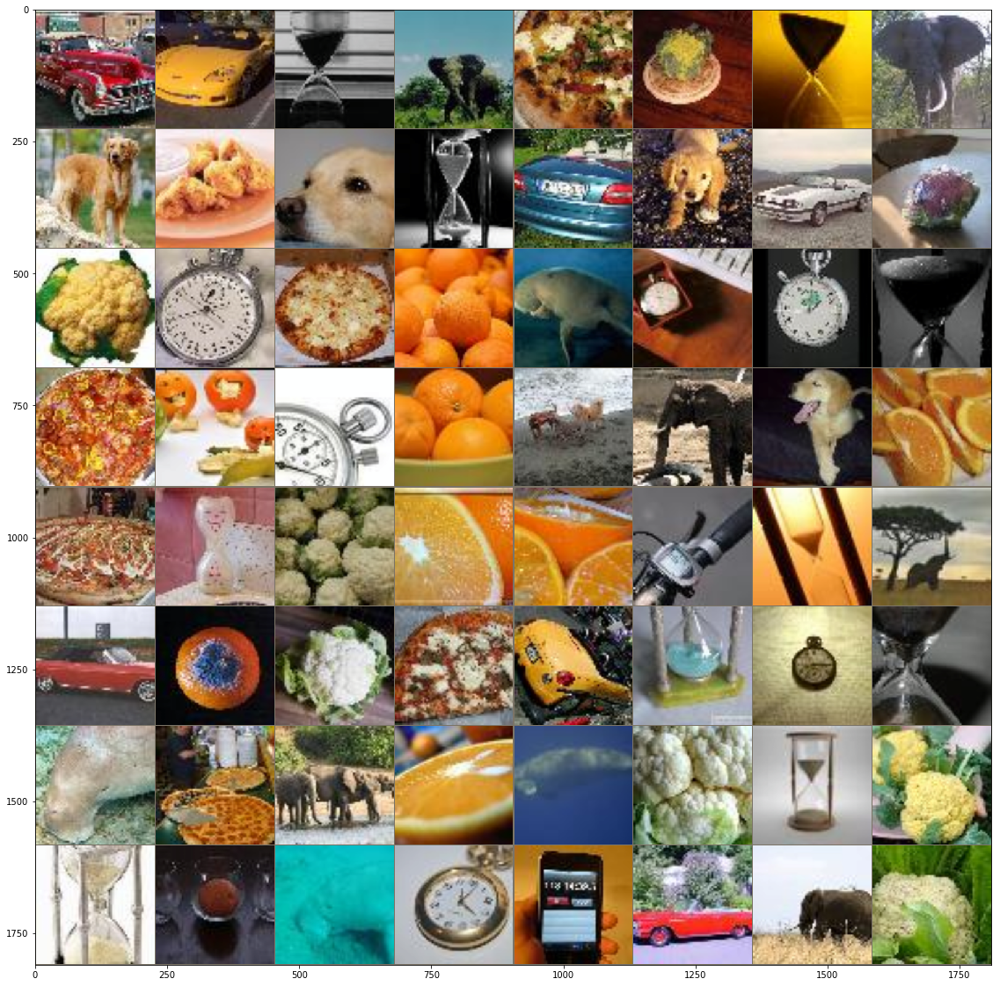

In [151]:
def generate_basis(concept_class, W):
    n_per_class = math.ceil(W.shape[1] / len(concept_class))
    prefix = '/data/jiaxuan/CNN_missingness/images/tiny-imagenet-200/train/'
    res = []
    concepts = []
    for c in concept_class:
        name = prefix + name2code[c]
        all_pics = glob(name + '/images/*')
        rs = np.random.choice(range(len(all_pics)), n_per_class, replace=False)
        res.extend([all_pics[r] for r in rs])
        concepts.extend([name2code[c] for r in rs])
        
    order = np.random.permutation(W.shape[1])
    res = np.array(res)[order]
    concepts = np.array(concepts)[order]
    return res, concepts

basis, concepts = generate_basis(concept_classes, W)

plt.figure(figsize=(20,20))
show_image(basis[:64])

In [308]:
def get_test_images(concept_class):
    anno = '/data/jiaxuan/CNN_missingness/images/tiny-imagenet-200/val/val_annotations.txt'
    d = {}
    with open(anno) as f:
        for l in f:
            k, v = l.split()[:2]
            d[k] = v
            
    prefix = '/data/jiaxuan/CNN_missingness/images/tiny-imagenet-200/val/images/'
    images = []
    labels = []
    for im in glob(prefix + '*'):
        c = d[im.split('/')[-1]]
        if imagenetcodedict[c] in concept_class:
            images.append(im)
            labels.append(c)
    return images, labels

test_images, test_labels = get_test_images(concept_classes)

In [313]:
features_test = extract_features(model, test_images)
A_test = features_test.data.cpu().numpy()

100%|██████████| 5/5 [00:00<00:00, 137.27it/s]


# quantify interpretation

In [206]:
# in this run, just use images from basis vectors for explaination
def print_result(W, concepts, errors, threshold=0.1, mask=True):
    coe = W
    print('"*" postfixed means error < %.4f' % threshold)
    print('%15s %10s %10s' % ('concepts', 'coeff', 'error'))
    print('-'*37)
    for w, c, e in sorted(zip(coe, concepts, errors), key=lambda x: abs(x[0]), reverse=True):
        if e < threshold:
            c = c+"*"
        else:
            if mask: c = 'unknown'
        print("%15s %10.4f %10.4f" % (c, w, e))   

def eval_direction(theta, c, l, A, plot=False, verbose=False):
    '''concept c, labels l, activation map A'''
    y = np.zeros(len(l))
    y[np.array(l) == c] = 1
    
    n, d = A.shape
    a = A.dot(theta).ravel()
    X = np.vstack([a, np.ones(n)]).T
    
    #print(X.shape, y.shape)
    
    m, b = np.linalg.lstsq(X, y)[0]
    error = np.mean((X.dot(np.array([m,b])) - y)**2)
    
    if verbose:
        print('%s error: %.4f, slope: %+.4f, intercept: %+4f' % (c.ljust(14), error, m, b))        
    if plot:
        colors = list(map(switch_color, l))
        transformed = X.dot(np.array([m,b]))
        plt.scatter(transformed, transformed + np.random.random(n), c=colors)
        plt.show()
    return error, m, b

def interpret_direction(t, concepts_list, labels, A):
    min_e = 1000
    min_c = ""
    min_m = 0
    for c in concepts_list:
        e, m, b = eval_direction(t, c, labels, A)
        if e < min_e:
            min_e = e
            min_c = c
            min_m = m
    return min_e, min_m, min_c 


100%|██████████| 30/30 [00:02<00:00, 11.11it/s]


W


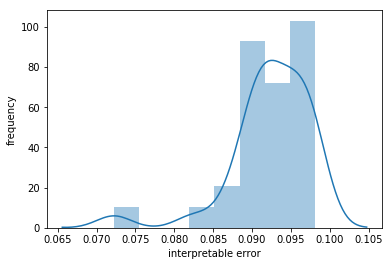

0.092365874580955326

In [329]:
# # explain
plot=False
verbose=True
min_c = []
errors = []
theta_list = []

d = W.shape[1]
# random sample a few directions
chosen_dirs = np.random.permutation(d)[:nruns]
for i in tqdm.tqdm(chosen_dirs):
    direction = np.zeros(d)
    direction[i] = 1
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test) 
    if m < 0:
        direction = -direction
    theta_list.append(direction)
    min_c.append(c)
    errors.append(e)
    #print('\nnueron %d' % i)
    #print('%14s error: %.4f sign(slope): %d' % (c, e, np.sign(m)))

print('W')
sns.distplot(errors)
plt.ylabel('frequency')
plt.xlabel('interpretable error')
plt.show()

W_errors = errors
np.mean(W_errors)

  3%|▎         | 1/30 [00:00<00:03,  7.95it/s]

how meaningful are random directions?


100%|██████████| 30/30 [00:03<00:00,  9.67it/s]


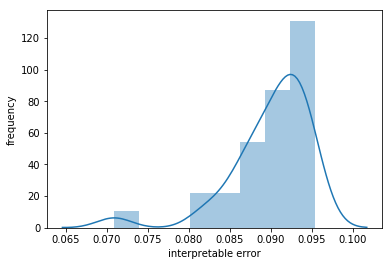

0.08998636697258168

In [330]:
print('how meaningful are random directions?')
nruns = 30
errors = []
for i in tqdm.tqdm(range(nruns)):
    e, m, c = interpret_direction(np.random.randn(W.shape[1]), concepts, test_labels, A_test)
    errors.append(e)
sns.distplot(errors)
plt.ylabel('frequency')
plt.xlabel('interpretable error')
plt.show()

random_errors = errors
np.mean(random_errors)

100%|██████████| 30/30 [00:00<00:00, 31.75it/s]


WP


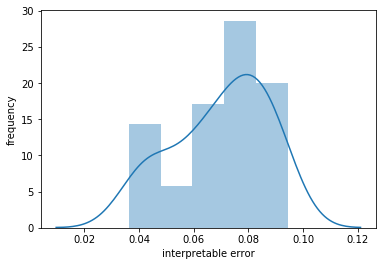

0.069792607638859527

In [331]:
# # explain
nruns = 30 
plot=False
verbose=True
min_c = []
errors = []
theta_list = []

d = W.shape[1]
# random sample a few directions
chosen_dirs = range(30) 
for i in tqdm.tqdm(chosen_dirs):
    direction = new_norm_P[:,i]
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test) 
    if m < 0:
        direction = -direction
    theta_list.append(direction)
    min_c.append(c)
    errors.append(e)

print('WP')
sns.distplot(errors)
plt.ylabel('frequency')
plt.xlabel('interpretable error')
plt.show()

WP_first30_errors = errors
np.mean(WP_first30_errors)

100%|██████████| 30/30 [00:01<00:00, 21.92it/s]


WP


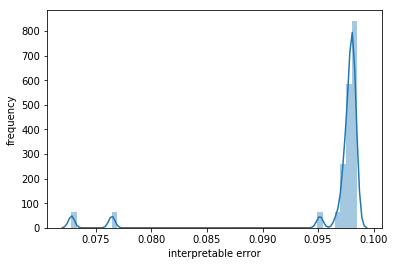

0.096246141328086912

In [332]:
# # explain
nruns = 30 
plot=False
verbose=True
min_c = []
errors = []
theta_list = []

d = W.shape[1]
# random sample a few directions
chosen_dirs = np.random.permutation(d)[:nruns]
for i in tqdm.tqdm(chosen_dirs):
    direction = new_norm_P[:,i]
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test) 
    if m < 0:
        direction = -direction
    theta_list.append(direction)
    min_c.append(c)
    errors.append(e)
    #print(e)
    #print('\nnueron %d' % i)
    #print('%14s error: %.4f sign(slope): %d' % (c, e, np.sign(m)))

print('WP')
sns.distplot(errors)
plt.ylabel('frequency')
plt.xlabel('interpretable error')
plt.show()

WP_random_errors = errors
np.mean(WP_random_errors)

In [333]:
def print_mean_std(errors, name=""):
    m, s = np.mean(errors), np.std(errors)
    print(('%20s mean: %.3f, std: %.4f') % (name, m, s))
    
print_mean_std(WP_first30_errors, "WP first 30")
print_mean_std(WP_random_errors, "WP random 30")
print_mean_std(W_errors, "W random 30")
print_mean_std(random_errors, "Random 30")


         WP first 30 mean: 0.070, std: 0.0169
        WP random 30 mean: 0.096, std: 0.0058
         W random 30 mean: 0.092, std: 0.0053
           Random 30 mean: 0.090, std: 0.0050


The above shows that ID has more uninterpretable directions than both random and W. In fact, random is the most interpretable. It also shows that WP's orthogonalization will severely affect interpretability.

100%|██████████| 600/600 [00:15<00:00, 37.82it/s]


WP


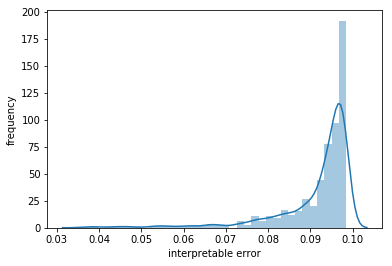

0.091354951951865077

In [334]:
# # explain
nruns = 30 
plot=False
verbose=True
min_c = []
errors = []
theta_list = []

d = W.shape[1]

chosen_dirs = range(600)
for i in tqdm.tqdm(chosen_dirs):
    direction = new_norm_P[:,i]
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test) 
    if m < 0:
        direction = -direction
    theta_list.append(direction)
    min_c.append(c)
    errors.append(e)
    #print(e)
    #print('\nnueron %d' % i)
    #print('%14s error: %.4f sign(slope): %d' % (c, e, np.sign(m)))

print('WP')
sns.distplot(errors)
plt.ylabel('frequency')
plt.xlabel('interpretable error')
plt.show()

WP_errors = errors
np.mean(WP_errors)

100%|██████████| 600/600 [00:49<00:00, 12.02it/s]


W


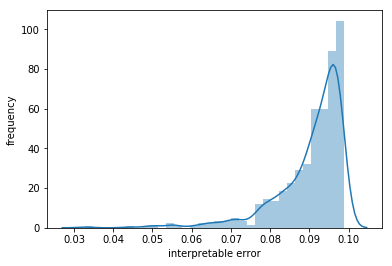

0.090276226275007754

In [335]:
# # explain
plot=False
verbose=True
min_c = []
errors = []
theta_list = []

d = W.shape[1]
# random sample a few directions
chosen_dirs = range(600) #np.random.permutation(d)[:nruns]
for i in tqdm.tqdm(chosen_dirs):
    direction = np.zeros(d)
    direction[i] = 1
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test) 
    if m < 0:
        direction = -direction
    theta_list.append(direction)
    min_c.append(c)
    errors.append(e)
    #print('\nnueron %d' % i)
    #print('%14s error: %.4f sign(slope): %d' % (c, e, np.sign(m)))

print('W')
sns.distplot(errors)
plt.ylabel('frequency')
plt.xlabel('interpretable error')
plt.show()

W_errors2 = errors
np.mean(W_errors2)
#P = np.vstack(theta_list).T
#print_result(W.dot(P)[0], min_c, errors, threshold, mask=True)
#print(np.mean(errors))


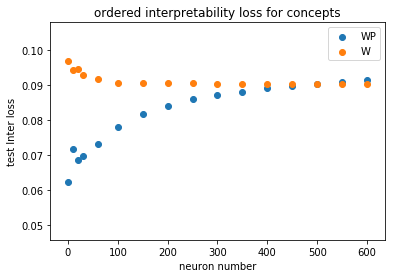

In [340]:
xs = [1,10,20,30,60,100,150,200,250,300,350,400,450,500,550,600]
ys = []
for x in xs:
    ys.append(np.mean(WP_errors[:x]))
plt.scatter(xs, ys, label='WP')

ys = []
for x in xs:
    ys.append(np.mean(W_errors2[:x]))
plt.scatter(xs, ys, label='W')

plt.legend()
plt.title('ordered interpretability loss for concepts')
plt.xlabel('neuron number')
plt.ylabel('test Inter loss')
plt.show()

In [341]:
def concept_scatter(a, concepts, labels):
    for c in concepts:
        a_ = a[labels==c]
        plt.scatter(a_, a_ + np.random.random(len(a_))*3, label=imagenetcodedict[c])
    plt.legend()

W activations


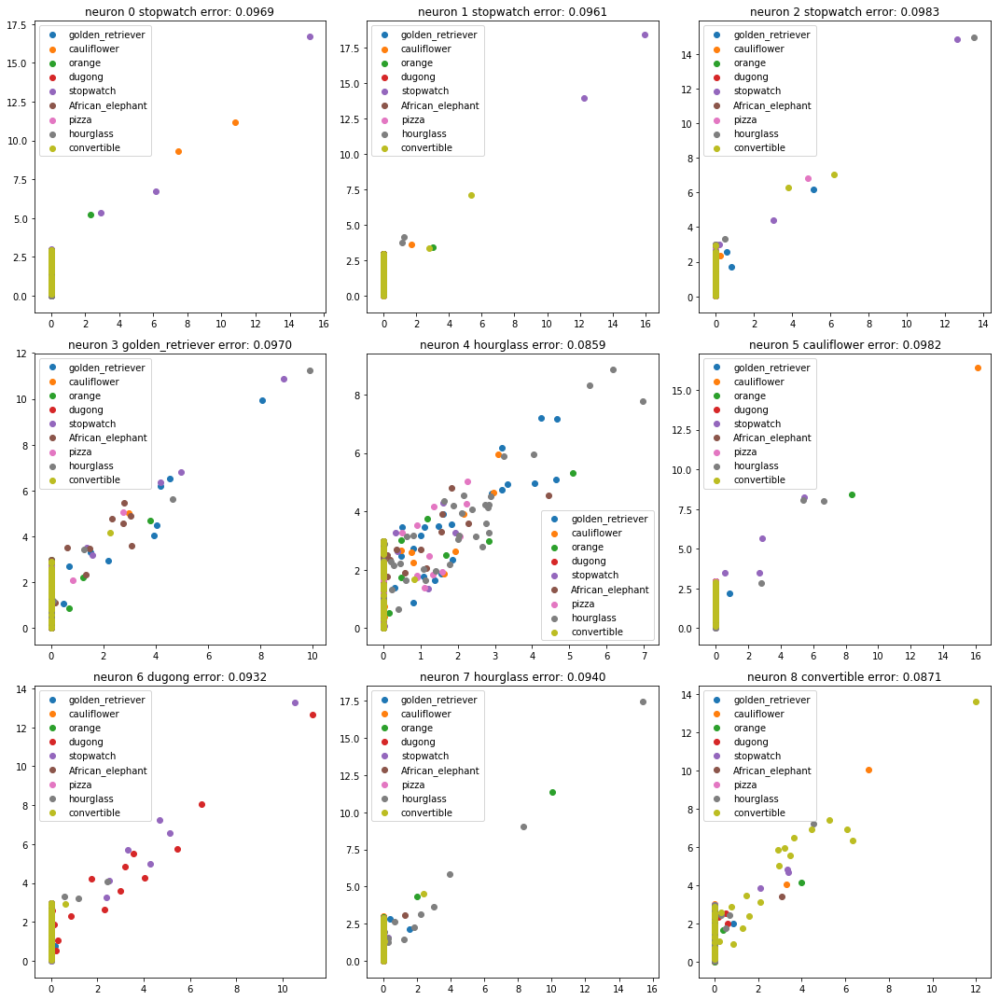

In [349]:
print('W activations')

plt.figure(figsize=(15,15))
for i in range(9):

    direction = np.zeros(d)
    direction[i] = 1
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test) 
    if m < 0:
        direction = -direction
    
    plt.subplot(3,3,i+1)
    a = A_test.dot(direction)
    if a.std() != 0:
        a = a / a.std()
    concept_scatter(a, concepts, np.array(test_labels))
    plt.title('neuron %d %s error: %.4f' % (i, imagenetcodedict[c], e))

plt.tight_layout()
plt.show()

WP activations


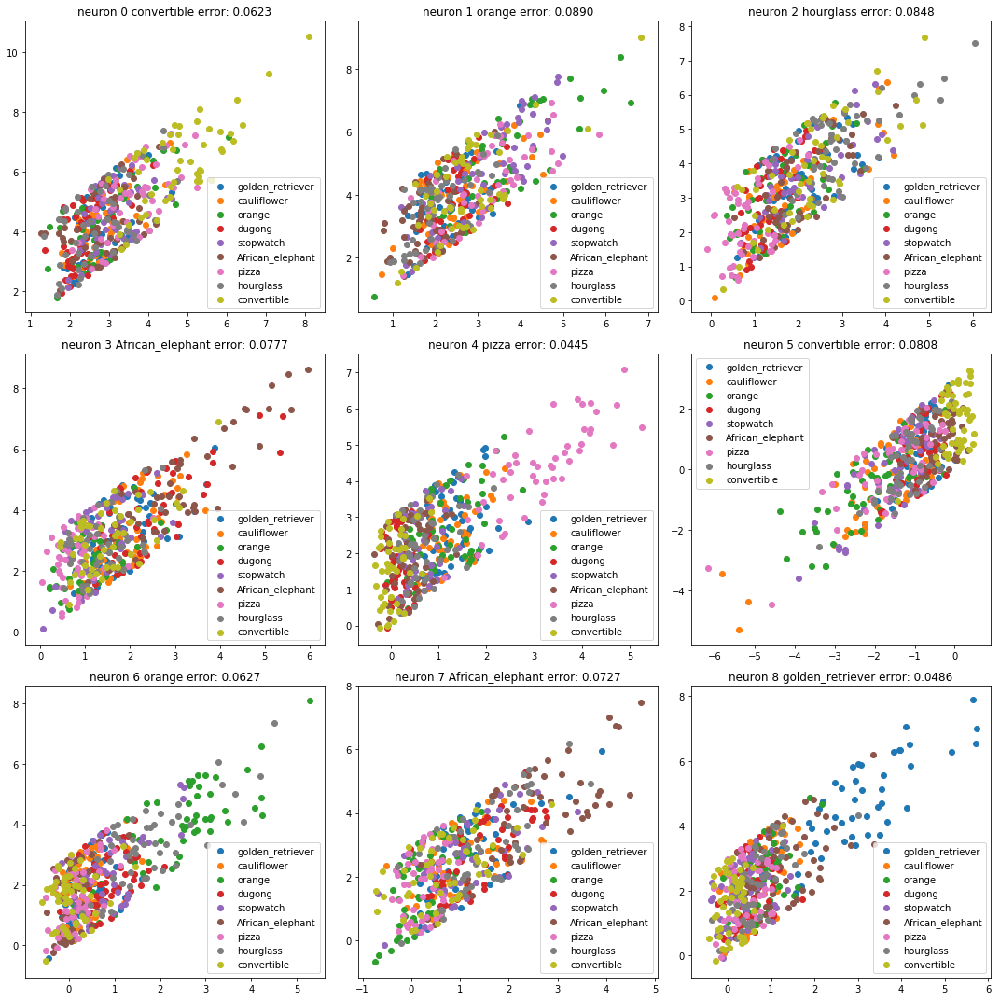

In [348]:
print('WP activations')

plt.figure(figsize=(15,15))
for i in range(9):

    direction = new_norm_P[:,i]
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test)
    if m < 0:
        direction = -direction

    plt.subplot(3,3,i+1)
    a = A_test.dot(direction)
    if a.std() != 0:
        a = a / a.std()
    concept_scatter(a, concepts, np.array(test_labels))
    plt.title('neuron %d %s error: %.4f' % (i, imagenetcodedict[c], e))

plt.tight_layout()
plt.show()

# See interpretability of each concept

  0%|          | 0/9 [00:00<?, ?it/s]

without orthogonal (concept order independent)


100%|██████████| 9/9 [18:09<00:00, 121.06s/it]


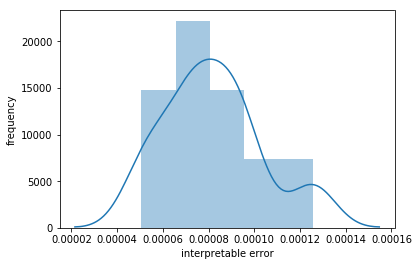

8.1828908062e-05


In [287]:
def fit_leastsq_concept(c, l, A, plot=False, verbose=False):
    '''concept c, labels l, activation map A'''
    cat = l #list(map(lambda x: x.split('/')[2], l))
    y = np.zeros(len(cat))
    y[np.array(cat) == c] = 1
    
    n, d = A.shape
    A = np.hstack([A, np.ones([n, 1])])
    #print(A.shape, y.shape)
    #assert False, "later"
    theta = np.linalg.lstsq(A, y)[0]
    error = np.mean((A.dot(theta) - y)**2)
    
    if verbose:
        print('%s error: %.4f' % (c.ljust(14), error))
    if plot:
        colors = list(map(switch_color, l))
        transformed = A.dot(theta).ravel()
        plt.scatter(transformed, transformed + np.random.random(n), c=colors)
        plt.show()
    return theta[:-1], error

plot, verbose = False, False
print('without orthogonal (concept order independent)')
errors = []
chosen_concepts = np.random.permutation(list(concepts))
theta_list = []
for c in tqdm.tqdm(chosen_concepts):
    theta, error = fit_leastsq_concept(c, labels, activations, plot, verbose)
    errors.append(error)
    theta_list.append(theta)

sns.distplot(errors)
plt.ylabel('frequency')
plt.xlabel('interpretable error')
plt.show()

learned_concept_errors = errors
print(np.mean(learned_concept_errors))

100%|██████████| 9/9 [00:02<00:00,  4.11it/s]


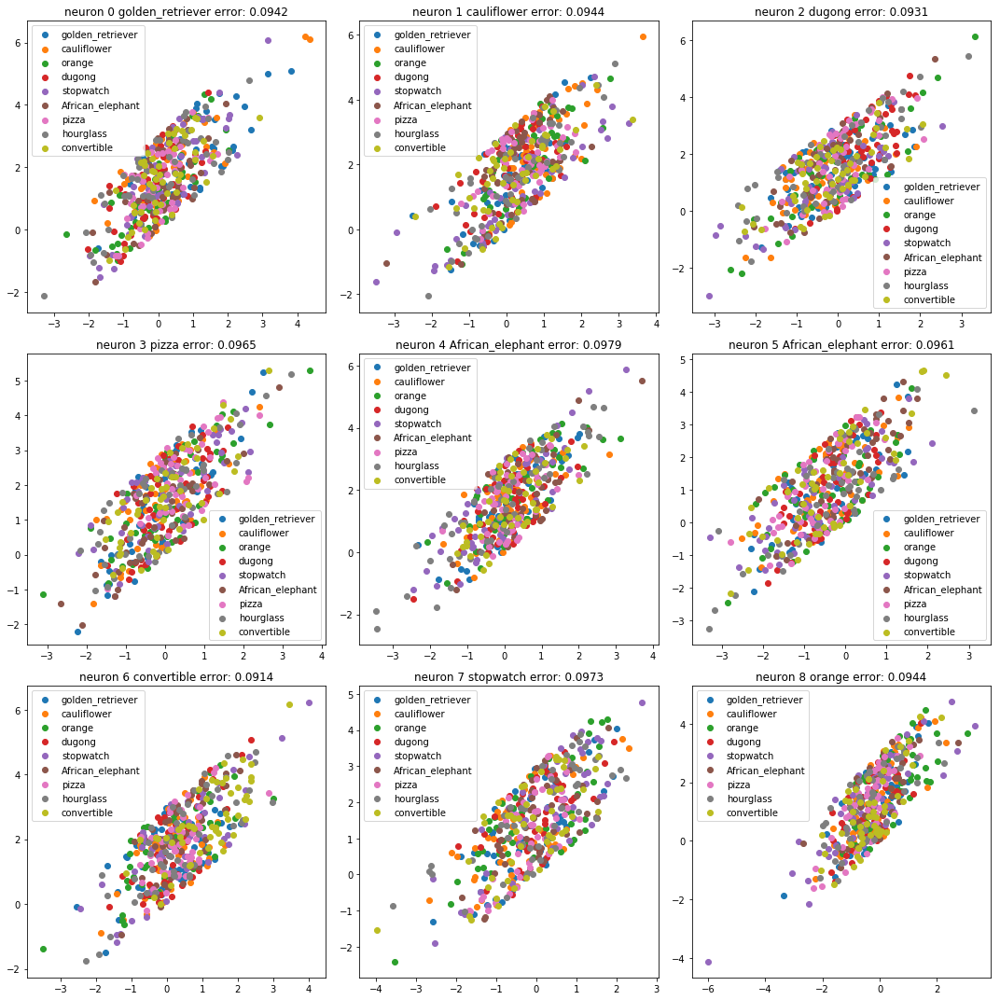

In [328]:
plt.figure(figsize=(15,15))
for i in tqdm.tqdm(range(9)):

    direction = theta_list[i]
    e, m, c = interpret_direction(direction, concepts, test_labels, A_test) 
    if m < 0:
        direction = -direction

    plt.subplot(3,3,i+1)
    a = A_test.dot(direction)
    if a.std() != 0:
        a = a / a.std()
    concept_scatter(a, concepts, np.array(test_labels))
    plt.title('neuron %d %s error: %.4f' % (i, imagenetcodedict[c], e))

plt.tight_layout()
plt.show()

this suggest that the learned directions vastly overfit the dataset

In [284]:
print_mean_std(WP_first30_errors, "WP first 30")
print_mean_std(WP_random_errors, "WP random 30")
print_mean_std(W_errors, "W random 30")
print_mean_std(random_errors, "Random 30")
print_mean_std(learned_concept_errors, "9 concepts")

         WP first 30 mean: 0.069, std: 0.0160
        WP random 30 mean: 0.096, std: 0.0079
         W random 30 mean: 0.093, std: 0.0052
           Random 30 mean: 0.091, std: 0.0039
          9 concepts mean: 0.000, std: 0.0000


learned concepts have a large potential to do fine on this dataset

However, this doesn't scale well for my application because least square regression is too slow in this case (ok because finding inverse is hard). Each least square regression in this task takes 2 minutes, and there are 9 concepts to try, with 4096 neurons to fill: this need >10 days to complete, which is not realistic.

To make it realistic for debugging, we can afford
2 (ls) x 4 (concepts) x 30 (last layer neurons) => 4 hours

For non greedy version:
2 x 30 => 1 hour

So this means we need to 
1. retrain the imagenet dataset (say on these 200 classes) freezing the previous layers (4096->30->10), do a 10 way classification
2. optional: rewrite least square regression to run faster
3. redo the explanation and hopefully the explained result is good


# How do we scale up

Obviously solving for 4096 dimensions is not an viable option, given that the computation of least square regression is not reusable (I originally thought I only need to solve least square for the 9 concepts and then projecting the directions as needed, however, that is not the case, see my whiteboard photo). This means that we are not able to parallelize the algorithm because each direction need the output of previous direction.

Then how are we going to explain large networks? Can we somehow cheat it? 4096 * 9 least squares is not going to be solvable unless we find someway to approximate least square, maybe a neural network taking A and b and gives you x.

So essentially 2 approaches if we want to interpret large neural network

1. use neural network to approximate a direction
2. leave interpretable neurons untouched, solve 30 more directions

## NN speedup 

In [421]:
class LR(nn.Module): # logistic regression with 2 neurons
    def __init__(self, input_size, output_size=2):
        super().__init__()
        
        self.i2o = nn.Linear(input_size, output_size)
        self.softmax = nn.LogSoftmax(dim=1)
        
        self.output_size = output_size
        self.input_size = input_size
        
    def forward(self, input):
        output = self.softmax(self.i2o(input))
        return output

def get_y(c, l, A):
    '''concept c, labels l, activation map A'''
    y = np.zeros(len(l))
    y[np.array(l) == c] = 1
    return y   

def plotDirection(direction, A, l, concepts):
    plt.figure(figsize=(7,7))
    e, m, c = interpret_direction(direction, concepts, l, A) 
    if m < 0:
        direction = -direction
    a = A.dot(direction)
    if a.std() != 0:
        a = a / a.std()
    concept_scatter(a, concepts, np.array(l))
    plt.title('%s error: %.4f' % (imagenetcodedict[c], e))    
    
def train(net, trainloader, criterion, optimizer, print_every=None, epochs=2, max_time=10):
    start = time.time()
    
    # max_time given in seconds
    for epoch in range(epochs):  # loop over the dataset multiple times

        running_loss = 0.0
        for i, data in enumerate(trainloader, 0):
            
            end = time.time()
            if end - start >= max_time:
                print('Finished Training in %ds' % (end-start))                
                return
            
            # get the inputs
            inputs, labels = data

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = net(to_var(inputs))
            loss = criterion(outputs, to_var(labels))
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.data[0]
            if print_every is not None and i % print_every == (print_every-1): 
                print('[%d, %5d] loss: %.10f' %
                      (epoch + 1, i + 1, running_loss / print_every))
                running_loss = 0.0

    print('Finished Training in %ds' % (end-start))



Finished Training in 3s


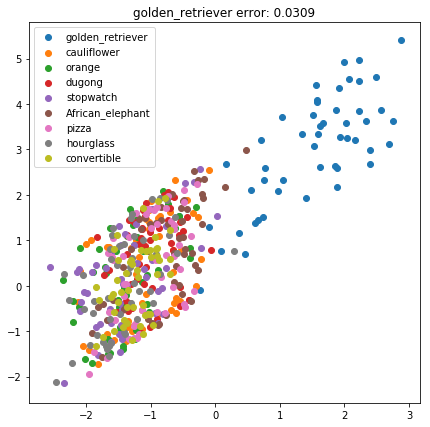

Finished Training in 3s


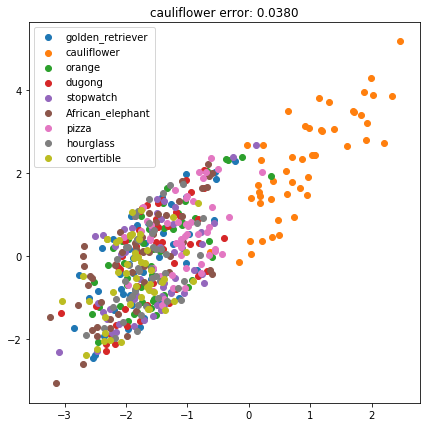

Finished Training in 3s


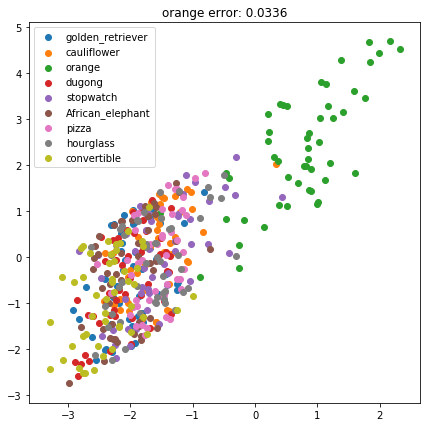

Finished Training in 3s


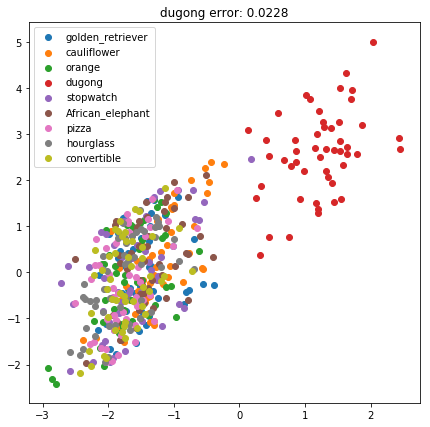

Finished Training in 3s


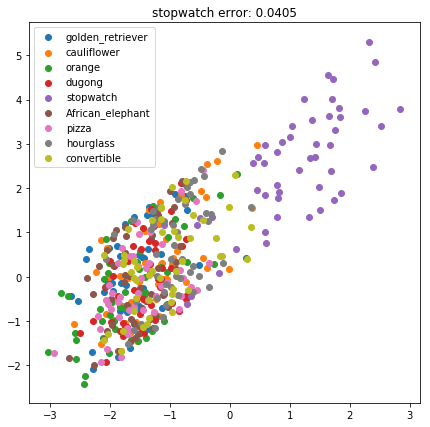

Finished Training in 3s


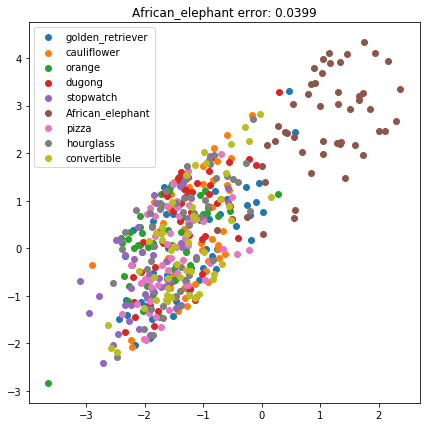

Finished Training in 3s


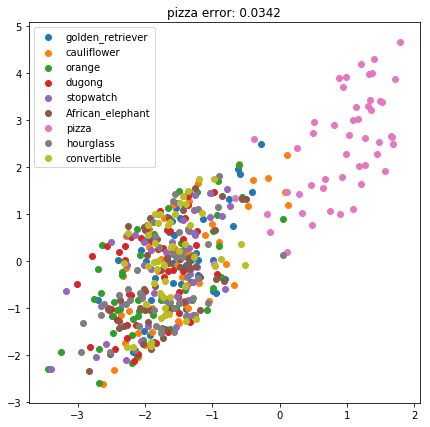

Finished Training in 3s


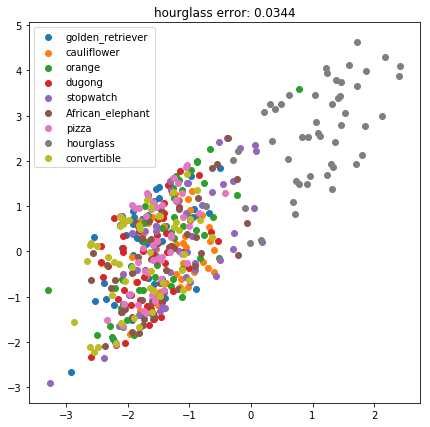

Finished Training in 3s


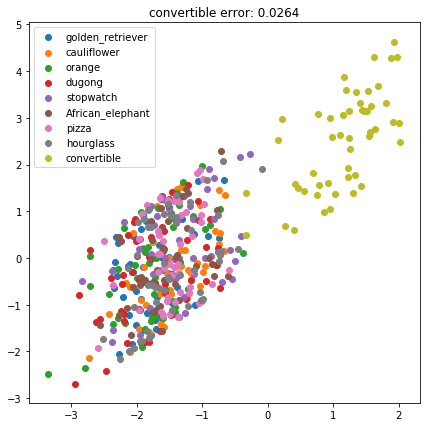

In [424]:
def custom_solve(A, y, max_time=3):
    concept_lr_data = TensorDataset(torch.from_numpy(A), torch.from_numpy(y).long())
    trainloader = DataLoader(concept_lr_data, batch_size=32, num_workers=1)
    
    concept_net = LR(4096)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(concept_net.parameters())
    train(concept_net, trainloader, criterion, optimizer, print_every=None, epochs=5, max_time=max_time)   
    
    theta = concept_net.i2o.weight
    theta = (theta[1] - theta[0]).data.numpy()
    return theta

def custom_leastsq_concept(c, l, A, max_time=3):
    '''concept c, labels l, activation map A'''
    y = get_y(c, l, A)
    theta = custom_solve(A, y, max_time=max_time)
    #error, m, b = eval_direction(theta, c, l, A)
    return theta#, error

for c in concepts:
    y = get_y(c, labels, A)
    t = custom_solve(A, y)
    plotDirection(t, A_test, test_labels, concepts)
    plt.show()

In [426]:
for c in tqdm.tqdm(concepts):
    t = custom_leastsq_concept(c, labels, A)
    error, m, b = eval_direction(t, c, test_labels, A_test)
    print(error)

 11%|█         | 1/9 [00:03<00:24,  3.06s/it]

Finished Training in 3s
0.0330478052185


 22%|██▏       | 2/9 [00:06<00:21,  3.04s/it]

Finished Training in 3s
0.0381660814703


 33%|███▎      | 3/9 [00:09<00:18,  3.04s/it]

Finished Training in 3s
0.0348253103158


 44%|████▍     | 4/9 [00:12<00:15,  3.04s/it]

Finished Training in 3s
0.0239563157695


 56%|█████▌    | 5/9 [00:15<00:12,  3.04s/it]

Finished Training in 3s
0.0405518196873


 67%|██████▋   | 6/9 [00:18<00:09,  3.05s/it]

Finished Training in 3s
0.0410896152738


 78%|███████▊  | 7/9 [00:21<00:06,  3.05s/it]

Finished Training in 3s
0.0317629844467


 89%|████████▉ | 8/9 [00:24<00:03,  3.05s/it]

Finished Training in 3s
0.0331873482962


100%|██████████| 9/9 [00:27<00:00,  3.05s/it]

Finished Training in 3s
0.0250146912628


# Build P

In [ ]:
print('Greedy interpret anyway (order independent)')

def buildP(A, concepts_list, labels, A_test, test_labels, threshold):

    def data_range(A, t):
        return A.dot(t/t.dot(t)).ravel().std()

    def normalize_theta(A, t):
        drange = data_range(A, t)
        if drange == 0: # no need to normalize
            return t
        return t * drange # multiply so that in P^-1 is divide by
    
    def greedy_find_c(concepts_list, labels, A, A_test, test_labels):
        # todo: change this to parallel
        min_e = 1000
        min_t = 0
        min_c = ""
        for c in concepts_list:
            theta = custom_leastsq_concept(c, labels, A)
            error, m, b = eval_direction(theta, c, test_labels, A_test)
            #theta, error = fit_leastsq_concept(c, labels, A)
            if error < min_e:
                min_e = error
                min_t = theta
                min_c = c
        return min_c, min_t, min_e
    
    A_backup = copy.deepcopy(A)
    theta_list = []
    
    concepts_used = []
    print('fitting directions......')
    errors = []
    for _ in tqdm.tqdm(range(A.shape[1])):
        min_c, theta, error = greedy_find_c(concepts_list, labels, A, A_test,test_labels)
        concepts_used.append(min_c)
        errors.append(error)
        theta = orthogonize(theta, theta_list) # just make sure theta are orthogonal # note: randomness here
        theta_list.append(theta)
        np.save("theta_list", theta_list)
        A = A - np.outer(A.dot(theta).ravel(), theta) / np.sum(theta**2) # project data down 1 dimension

    A = copy.deepcopy(A_backup)
    P = np.vstack(theta_list).T
    
    # decorrelate unknown data using pca
    B = A.dot(ortho_inverse(P).T) # new activation
    A = []
    ind_changed = []
    for i in range(len(P)):
        if errors[i] >= threshold:
            A.append(B[:,i])
            ind_changed.append(i)
    if len(ind_changed) > 0:
        A = np.vstack(A).T
        print('doing pca %d directions need changes......' % len(ind_changed))
        pca = PCA(n_components=A.shape[1]) 
        pca.fit(A) # takes 5 min
        
        P_subset = np.vstack([P[:,i] for i in ind_changed]).T

        pca_comp = P_subset.dot(pca.components_.T) # n_comp x d
        for i, ind in enumerate(ind_changed):
            comp = pca_comp[:,i] 
            theta_list[ind] = comp

    # normalize variance
    print('normalizing variance......')
    A = copy.deepcopy(A_backup)
    
    theta_list = [normalize_theta(A, t) for t in theta_list]
    
    # this is also slow: 5 hours, could speed up by parallel (30 cpu will cut down to 9 minutes)   
    print('reevaluating direction errors......') 
    emc = [interpret_direction(t, concepts_list, labels, A)\
           for t in theta_list]    
    errors = list(map(lambda x: x[0], emc))
    slopes = list(map(lambda x: x[1], emc))
    min_c = list(map(lambda x: x[2], emc))
    theta_list = list(map(lambda x: x[0] * np.sign(x[1]), zip(theta_list, slopes)))
    
    P = np.vstack(theta_list).T

    return P, errors, theta_list, min_c

A = copy.deepcopy(activations)
threshold = 0.07
P, errors, theta_list, min_c = buildP(A, concepts, labels, A_test, test_labels,
                                      threshold=threshold)
#newW = W.dot(P)
#print_result(newW, min_c, errors, threshold, mask=True)
#check_ortho(theta_list)


  0%|          | 0/4096 [00:00<?, ?it/s]

Greedy interpret anyway (order independent)
fitting directions......
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 1/4096 [00:27<31:36:07, 27.78s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 2/4096 [00:55<31:23:18, 27.60s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 3/4096 [01:22<31:19:46, 27.56s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 4/4096 [01:50<31:18:19, 27.54s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 5/4096 [02:17<31:17:00, 27.53s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 6/4096 [02:45<31:16:47, 27.53s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 7/4096 [03:12<31:16:13, 27.53s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 8/4096 [03:40<31:15:23, 27.53s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 9/4096 [04:07<31:13:43, 27.51s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 10/4096 [04:35<31:12:48, 27.50s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 11/4096 [05:02<31:11:56, 27.49s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 12/4096 [05:29<31:11:12, 27.49s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 13/4096 [05:57<31:10:49, 27.49s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 14/4096 [06:24<31:10:01, 27.49s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 15/4096 [06:52<31:09:22, 27.48s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 16/4096 [07:19<31:09:08, 27.49s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


  0%|          | 17/4096 [07:47<31:08:07, 27.48s/it]

Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s
Finished Training in 3s


## next steps

1. parallelize the code to run under 5 hours (now is 30 hours), use mld3 to run this
2. introduce confounder in tiny imagenet
3. only fill in uninterpretable directions of W
4. look at weight of interpretable directions to see how import

In [ ]:
# disadvantage: dimension may be too large
# advantage: infinite training data

class InverseSolver(nn.Module):
    
    def __init__(self, n , r, hidden_size=None):
        # A is an n x r matrix: e.g. 256 * 4096
        self.n = n
        self.r = r
        if hidden_size = None:
            self.hidden_size = 2 * r
        
        self.classifier = nn.Sequential(
            nn.Linear(hidden_size, )
        )
        
    def forward(self, A, b):        
        pass

In [352]:
256 * 4096

1048576

## leave interpretable W untouched

         WP first 30 mean: 0.069, std: 0.0160
        WP random 30 mean: 0.096, std: 0.0079
         W random 30 mean: 0.093, std: 0.0052
           Random 30 mean: 0.091, std: 0.0039
          9 concepts mean: 0.000, std: 0.0000
